### Dataset Download
Through executing the following command, the dataset will be downloaded in this directory inside another directory called data. The dataset is called Food-101 and is available in kaggle for free.

In [46]:
#import os
#os.environ['KAGGLE_CONFIG_DIR'] = os.path.join(os.getcwd(), '.kaggle')

#!kaggle datasets download -d kmader/food41 -p data --unzip


### Train list
Opens the train list inside the kaggle dataset that contains all the classes the model should be trained with.

In [47]:
with open('data/meta/meta/train.txt') as file:
    train_list = file.read().splitlines()

### Image View
The following code access the images inside the dataset through the os library. It uses the Counter function from collections to be able to count the most common images inside a specified class. The PIL and matplotlib libraries allow to view the images selected by the counter function.

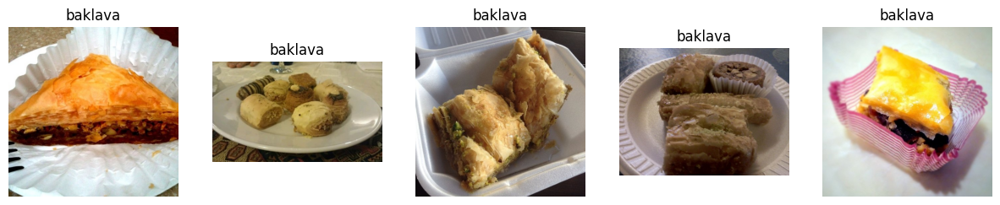

In [49]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt
import os

train_classes = [path.split('/')[0] for path in train_list]
# Detect the 5 most common classes
Counter(train_classes).most_common(5)

# Show sample image
sample_class = 'baklava'
sample_path = os.path.join("data/images", sample_class)
sample_imgs = os.listdir(sample_path)[:5]

fig, axs = plt.subplots(1, 5, figsize=(15, 3))
for i, img_name in enumerate(sample_imgs):
    img = Image.open(os.path.join(sample_path, img_name))
    axs[i].imshow(img)
    axs[i].set_title(sample_class)
    axs[i].axis("off")

### API Handling
To obtain the nutritional information of each class, the API from the official USDA website is used. To be able to access the dataset you need to generate your own API Key in the official website.
- NOTE: Originally, the FatSecret API was going to be used to obtain nutritional information, however it required information such as IP registration that complicated the code unnecessarily. 

In [14]:
import json
import requests
# To load from future .env variable
from dotenv import load_dotenv


API_KEY = 'Ni0szuckIPwMUTMn7mEtC03f9Dkf4oNF9odaYMKl'
BASE_URL = "https://api.nal.usda.gov/fdc/v1"

# Specify which nutriets are going to be extracted from the API
NUTRIENTS_TO_EXTRACT = {"Energy" : None,
                        "Protein" : None,
                        "Carbohydrate, by difference" : None,
                        "Total Sugars" : None,
                        "Total lipid (fat)" : None}

def search_food(query, page_size=1):
    url = f'{BASE_URL}/foods/search'
    params = {"query":query.replace("_", " "), 
              "pageSize":page_size,
              "api_key":API_KEY}
    response = requests.get(url, params=params)
    response.raise_for_status()
    data = response.json()
    if data["foods"]:
        return data["foods"][0]['fdcId']
    return None


def get_food_nutrition(fdc_id):
    url = f'{BASE_URL}/food/{fdc_id}'
    params = {"api_key":API_KEY}
    response = requests.get(url, params=params)
    response.raise_for_status()
    data = response.json()

    nutrients = {key: None for key in NUTRIENTS_TO_EXTRACT}
 
    

    for nutrient in data.get('foodNutrients', []):
        name = nutrient.get("nutrient", {}).get("name")
        unit = nutrient.get("nutrient", {}).get("unitName")
        amount = nutrient.get("amount")

        if name in nutrients and amount is not None:
            nutrients[name] = {"amount": amount, "unit": unit}

    return nutrients

# Test
food = "baklava"
fdc_id = search_food(food)
nutrition_info = get_food_nutrition(fdc_id)

print(f"\n📊 Nutritional values for: {food}\n")
for name, data in nutrition_info.items():
    if data:
        print(f"{name}: {data['amount']} {data['unit']}")
    else:
        print(f"{name}: Not found")


# Testing of raw API calls
# Test
#for nutrient in info['foodNutrients']:
#    print(nutrient)
#    if nutrient['nutrient']['name'] in ['Protein', 'Energy', 'Carbohydrate, by difference', 'Total Sugars', 'Total lipid (fat)']:
#        inf = f'{nutrient['nutrient']['name']}: {nutrient['amount']} {nutrient['nutrient']['unitName']}'
#        json.dumps(inf, indent=2)
#        print(inf)


📊 Nutritional values for: baklava

Energy: 440 kcal
Protein: 6.58 g
Carbohydrate, by difference: 37.6 g
Total Sugars: 12.8 g
Total lipid (fat): 29.3 g


### Store information in a JSON file
The following code stores a class and its nutritional value in the nutrition_data.json file.

In [ ]:
import time

def main():
    with open("data/meta/meta/classes.txt", "r") as f:
        classes = [line.strip() for line in f.readlines()]

    nutrition_data = {}
    not_found = []

    for food in classes:
        print(f"🔎 Searching: {food}")
        try:
            fdc_id = search_food(food)
            if not fdc_id:
                print(f"❌ No result for {food}")
                not_found.append(food)
                continue

            nutrition = get_food_nutrition(fdc_id)
            nutrition_data[food] = nutrition
            print(f"✅ Saved: {food}")
        except Exception as e:
            print(f"🚨 Error with {food}: {e}")
            not_found.append(food)
        time.sleep(1.2)  # avoid rate limit for API

    with open("nutrition_data.json", "w") as f:
        json.dump(nutrition_data, f, indent=2)

    with open("not_found.txt", "w") as f:
        for item in not_found:
            f.write(item + "\n")

    print("\n✅ Done. Data saved to nutrition_data.json")
    print(f"❗ {len(not_found)} items could not be resolved. See not_found.txt.")

main()


🔎 Searching: apple_pie
✅ Saved: apple_pie
🔎 Searching: baby_back_ribs
✅ Saved: baby_back_ribs
🔎 Searching: baklava
✅ Saved: baklava
🔎 Searching: beef_carpaccio
✅ Saved: beef_carpaccio
🔎 Searching: beef_tartare
✅ Saved: beef_tartare
🔎 Searching: beet_salad
✅ Saved: beet_salad
🔎 Searching: beignets
✅ Saved: beignets
🔎 Searching: bibimbap
✅ Saved: bibimbap
🔎 Searching: bread_pudding
✅ Saved: bread_pudding
🔎 Searching: breakfast_burrito
✅ Saved: breakfast_burrito
🔎 Searching: bruschetta
✅ Saved: bruschetta
🔎 Searching: caesar_salad
✅ Saved: caesar_salad
🔎 Searching: cannoli
✅ Saved: cannoli
🔎 Searching: caprese_salad
✅ Saved: caprese_salad
🔎 Searching: carrot_cake
✅ Saved: carrot_cake
🔎 Searching: ceviche
✅ Saved: ceviche
🔎 Searching: cheesecake
✅ Saved: cheesecake
🔎 Searching: cheese_plate
✅ Saved: cheese_plate
🔎 Searching: chicken_curry
✅ Saved: chicken_curry
🔎 Searching: chicken_quesadilla
✅ Saved: chicken_quesadilla
🔎 Searching: chicken_wings
✅ Saved: chicken_wings
🔎 Searching: chocola

In [ ]:
import os

for root, dirs, files in os.walk("data"):
    print(root)
    for file in files[:3]:  # show just some files per directory
        print("   ", file)


data
    food_c101_n1000_r384x384x3.h5
    food_c101_n10099_r32x32x1.h5
    food_c101_n10099_r32x32x3.h5
data\images
data\images\apple_pie
    1005649.jpg
    1011328.jpg
    101251.jpg
data\images\baby_back_ribs
    1005066.jpg
    1005293.jpg
    1007102.jpg
data\images\baklava
    1006121.jpg
    1014880.jpg
    1021344.jpg
data\images\beef_carpaccio
    100853.jpg
    1011469.jpg
    1012548.jpg
data\images\beef_tartare
    1000431.jpg
    1005746.jpg
    1009672.jpg
data\images\beet_salad
    1003501.jpg
    1005864.jpg
    1006123.jpg
data\images\beignets
    1000911.jpg
    1002569.jpg
    1002850.jpg
data\images\bibimbap
    1001113.jpg
    1002297.jpg
    1004374.jpg
data\images\bread_pudding
    1004499.jpg
    1004540.jpg
    1005036.jpg
data\images\breakfast_burrito
    1000351.jpg
    1000669.jpg
    1000920.jpg
data\images\bruschetta
    1003796.jpg
    1013211.jpg
    1018048.jpg
data\images\caesar_salad
    1000016.jpg
    1000435.jpg
    1011441.jpg
data\images\cannoli

### Image verification Testing
Searches if an image exists inside the kaggle folders.

In [15]:
import os

# Code to test image verififcation from train.txt or test.txt
entry = "apple_pie/1005649"  # example
class_name, image_name = entry.split('/')

img_path = os.path.join("data", "images", class_name, image_name + ".jpg")

print("🧪 Verifying:", img_path)
print("✅ Exists" if os.path.exists(img_path) else "❌ Not Found")


🧪 Verifying: data\images\apple_pie\1005649.jpg
✅ Exists


### Dataset conversion to YOLO format
Transforms the kaggle data set into a YOLO dataset format. Stores the data of the images and generates a box around them to locate food.

In [ ]:
import os
import shutil

# Routes of the original dataset and the destiny
FOOD101_DIR = "data"
OUTPUT_DIR = "yolo_dataset"

# Create destiny directories
splits = ['train', 'val']
for split in splits:
    os.makedirs(os.path.join(OUTPUT_DIR, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(OUTPUT_DIR, 'labels', split), exist_ok=True)

# Read Classes (from the classes.txt file)
with open(os.path.join(FOOD101_DIR, 'meta', 'meta', 'classes.txt')) as f:
    classes = [line.strip() for line in f.readlines()]
class_to_index = {name: i for i, name in enumerate(classes)}

# Read lists from Training and Testing
def load_split(split_name):
    with open(os.path.join(FOOD101_DIR, 'meta', 'meta', f'{split_name}.txt')) as f:
        return [line.strip() for line in f.readlines()]

splits_dict = {
    'train': load_split('train'),
    'val': load_split('test')  # Use test.txt as validation for YOLO
}

not_found = []

# Create YOLO Labels
for split, items in splits_dict.items():
    for entry in items:
        class_name = entry.split('/')[0]
        image_name = entry.split('/')[1]
        class_id = class_to_index[class_name]

        src_img = os.path.join(FOOD101_DIR, 'images', class_name, image_name + '.jpg')
        dst_img = os.path.join(OUTPUT_DIR, 'images', split, image_name + '.jpg')
        dst_label = os.path.join(OUTPUT_DIR, 'labels', split, image_name + '.txt')
        print(src_img, dst_img, dst_label)
        # Copy image
        if not os.path.exists(src_img):
            print(f"❌ Imagen no encontrada: {src_img}")
            not_found.append(entry)
            continue

        shutil.copy2(src_img, dst_img)


        # Create label with total box bounding
        with open(dst_label, 'w') as f:
            # class_id x_center y_center width height (all normalized to 1.0)
            f.write(f"{class_id} 0.5 0.5 1.0 1.0\n")

print("✅ Dataset converted to YOLOv8 format successfully.")


data\images\apple_pie\1005649.jpg yolo_dataset\images\train\1005649.jpg yolo_dataset\labels\train\1005649.txt
data\images\apple_pie\1014775.jpg yolo_dataset\images\train\1014775.jpg yolo_dataset\labels\train\1014775.txt
data\images\apple_pie\1026328.jpg yolo_dataset\images\train\1026328.jpg yolo_dataset\labels\train\1026328.txt
data\images\apple_pie\1028787.jpg yolo_dataset\images\train\1028787.jpg yolo_dataset\labels\train\1028787.txt
data\images\apple_pie\1043283.jpg yolo_dataset\images\train\1043283.jpg yolo_dataset\labels\train\1043283.txt
data\images\apple_pie\1050519.jpg yolo_dataset\images\train\1050519.jpg yolo_dataset\labels\train\1050519.txt
data\images\apple_pie\1057749.jpg yolo_dataset\images\train\1057749.jpg yolo_dataset\labels\train\1057749.txt
data\images\apple_pie\1057810.jpg yolo_dataset\images\train\1057810.jpg yolo_dataset\labels\train\1057810.txt
data\images\apple_pie\1072416.jpg yolo_dataset\images\train\1072416.jpg yolo_dataset\labels\train\1072416.txt
data\image

### YAML conversion
Converts the classes into a YAML file called food101.yaml.

In [ ]:
# Route to the class file
CLASSES_PATH = "data/meta/meta/classes.txt"
# Output route to the YAML file
OUTPUT_YAML = "food101.yaml"

with open(CLASSES_PATH, "r") as f:
    classes = [line.strip() for line in f.readlines()]

yaml_lines = []
yaml_lines.append("path: yolo_dataset")
yaml_lines.append("train: images/train")
yaml_lines.append("val: images/val")
yaml_lines.append("")
yaml_lines.append("names:")

for i, cls in enumerate(classes):
    yaml_lines.append(f"  {i}: {cls}")

# Write the YAML file
with open(OUTPUT_YAML, "w") as f:
    f.write("\n".join(yaml_lines))

print(f"✅ YAML file generated successfully in '{OUTPUT_YAML}'")


✅ Archivo YAML generado correctamente en 'food101.yaml'


In [12]:
# Route to the class file
CLASSES_PATH = "data/meta/meta/test.txt"
# Output route to the YAML file
OUTPUT_YAML = "food101_test.yaml"

with open(CLASSES_PATH, "r") as f:
    classes = [line.strip() for line in f.readlines()]

yaml_lines = []
yaml_lines.append("path: yolo_dataset")
yaml_lines.append("train: images/train")
yaml_lines.append("val: images/val")
yaml_lines.append("")
yaml_lines.append("names:")

for i, cls in enumerate(classes):
    yaml_lines.append(f"  {i}: {cls}")

# Write the YAML file
with open(OUTPUT_YAML, "w") as f:
    f.write("\n".join(yaml_lines))

print(f"✅ YAML file generated successfully in '{OUTPUT_YAML}'")


✅ YAML file generated successfully in 'food101_test.yaml'


In [ ]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("Name of the Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


CUDA Disponible: True
Nombre del dispositivo: NVIDIA GeForce RTX 3060 Laptop GPU


In [ ]:
!yolo detect train data=food101.yaml model=yolov8n.pt epochs=10 imgsz=416 batch=32 augment='{"degrees": 15}' name=food101_yolov8

^C


In [13]:
!yolo detect val model=runs/detect/food101_yolov87/weights/best.pt data=food101_test.yaml

^C


Ultralytics 8.3.160  Python-3.12.0 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 72 layers, 3,341,027 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 357.3125.4 MB/s, size: 51.2 KB)
                   all      25250      25250      0.737      0.695      0.766       0.76
             apple_pie        250        250      0.545       0.18       0.34      0.333
        baby_back_ribs        250        250      0.704        0.8      0.812      0.804
               baklava        250        250      0.718      0.816      0.858      0.852
        beef_carpaccio        250        250      0.746      0.844      0.884       0.88
          beef_tartare        250        250      0.689      0.696      0.776      0.773
            beet_salad        250        250      0.676      0.608      0.672      0.668
              beignets        250        250      0.748       0.84      0.868      0.864
              bibimbap


val: Scanning C:\Users\Alejandro Guerra\PycharmProjects\Food_Recognition\yolo_dataset\labels\val.cache... 25250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 25250/25250 [00:00<?, ?it/s]
val: Scanning C:\Users\Alejandro Guerra\PycharmProjects\Food_Recognition\yolo_dataset\labels\val.cache... 25250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 25250/25250 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1579 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 1/1579 [00:00<16:26,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 2/1579 [00:00<09:19,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 3/1579 [00:00<06:59,  3.75it/s]
                 Class     Images  Instances      Box(P          R

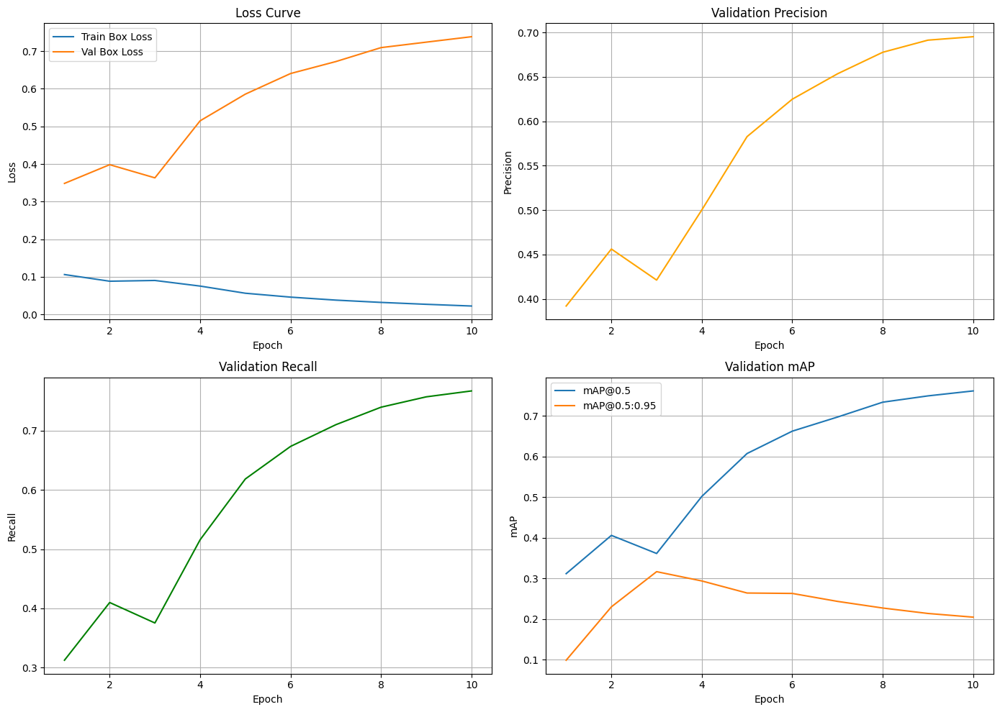

In [6]:
import os
import matplotlib.pyplot as plt

# Path to YOLOv8 results directory
results_dir = "runs/detect/food101_yolov87"
results_file = os.path.join(results_dir, "results.csv")

# Check if the results file exists
if not os.path.exists(results_file):
    raise FileNotFoundError(f"The file {results_file} was not found. Have you completed training?")

# Lists to store metrics
epochs = []
train_box_loss = []
val_box_loss = []
precision = []
recall = []
mAP50 = []
mAP50_95 = []

# Read results from the CSV file
with open(results_file, "r") as f:
    lines = f.readlines()

# Parse data
header = lines[0].strip().split(",")
for line in lines[1:]:
    values = line.strip().split(",")
    epoch = int(values[0])
    train_box = float(values[2])     # Train box loss
    val_box = float(values[5])       # Validation box loss
    prec = float(values[6])          # Precision
    rec = float(values[7])           # Recall
    map50 = float(values[8])         # mAP@0.5
    map50_95 = float(values[9])      # mAP@0.5:0.95

    epochs.append(epoch)
    train_box_loss.append(train_box)
    val_box_loss.append(val_box)
    precision.append(prec)
    recall.append(rec)
    mAP50.append(map50)
    mAP50_95.append(map50_95)

# Plot loss curves and metrics
plt.figure(figsize=(14, 10))

# Subplot 1: Loss
plt.subplot(2, 2, 1)
plt.plot(epochs, train_box_loss, label='Train Box Loss')
plt.plot(epochs, val_box_loss, label='Val Box Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.legend()
plt.grid(True)

# Subplot 2: Precision
plt.subplot(2, 2, 2)
plt.plot(epochs, precision, label='Precision', color='orange')
plt.xlabel("Epoch")
plt.ylabel("Precision")
plt.title("Validation Precision")
plt.grid(True)

# Subplot 3: Recall
plt.subplot(2, 2, 3)
plt.plot(epochs, recall, label='Recall', color='green')
plt.xlabel("Epoch")
plt.ylabel("Recall")
plt.title("Validation Recall")
plt.grid(True)

# Subplot 4: mAP
plt.subplot(2, 2, 4)
plt.plot(epochs, mAP50, label='mAP@0.5')
plt.plot(epochs, mAP50_95, label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("mAP")
plt.title("Validation mAP")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()
